Rear wheel feedback tracking simulation started!!


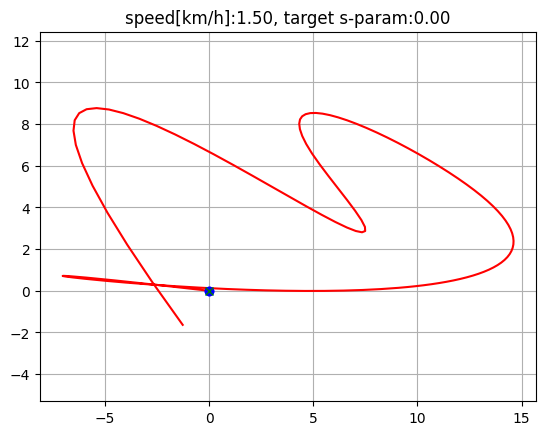

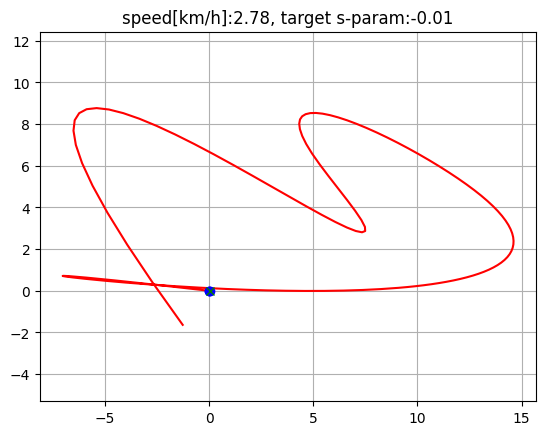

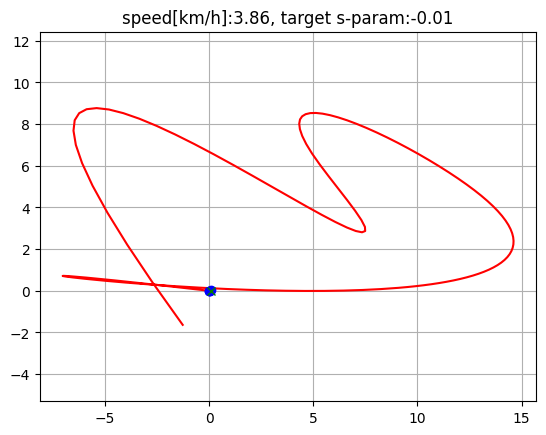

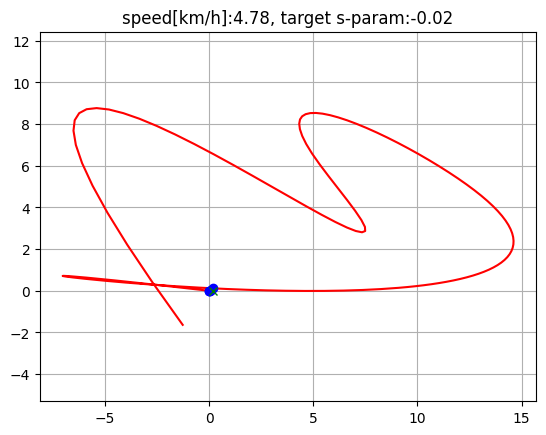

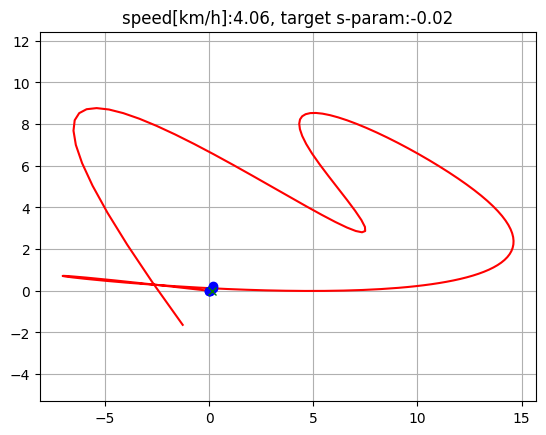

...

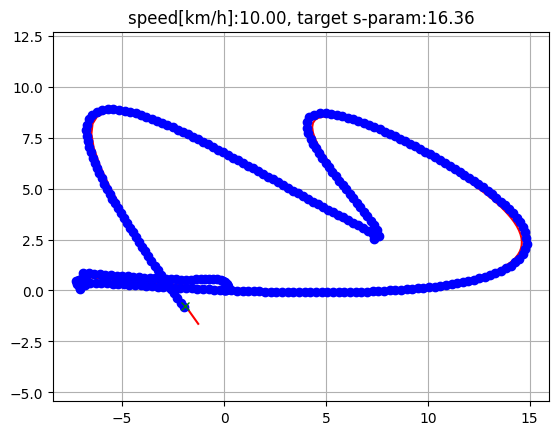

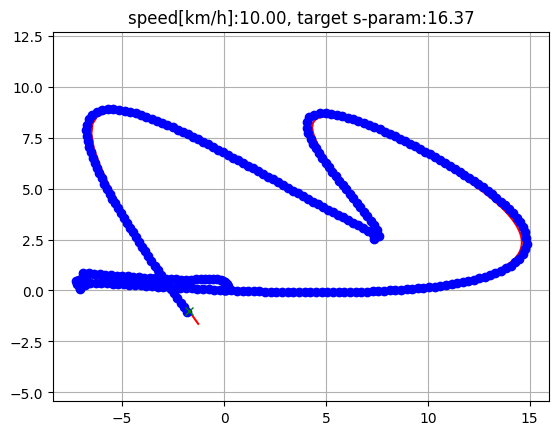

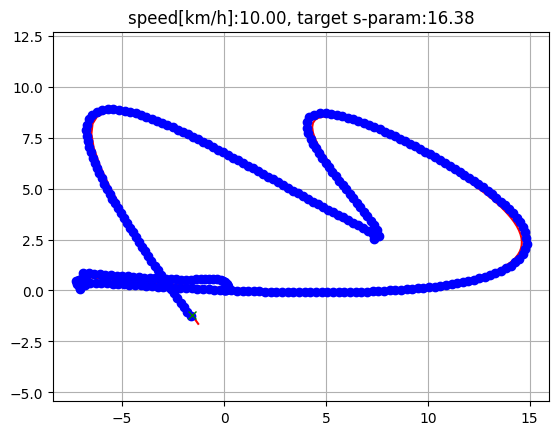

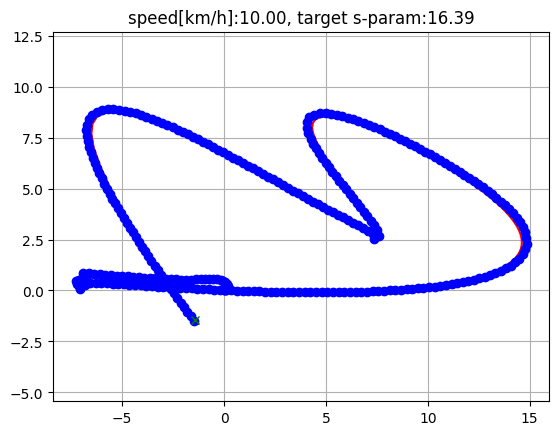

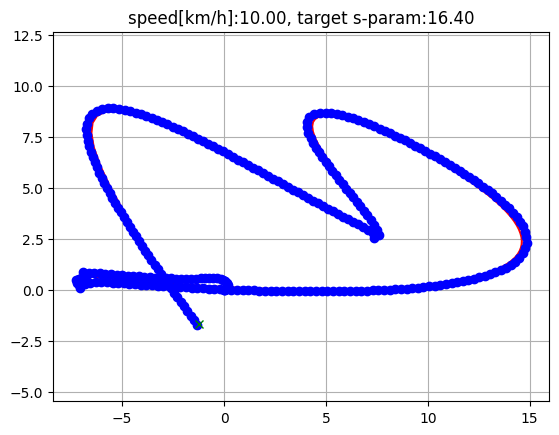

Goal


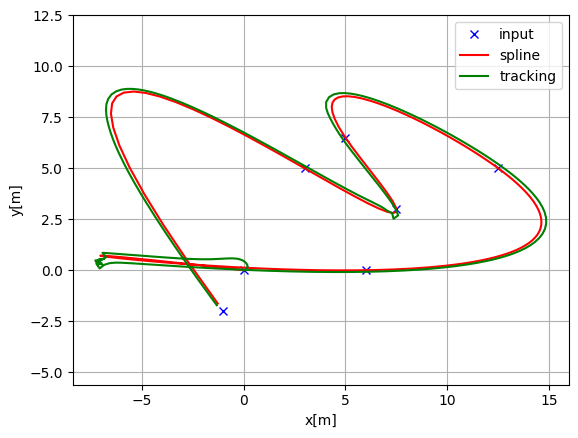

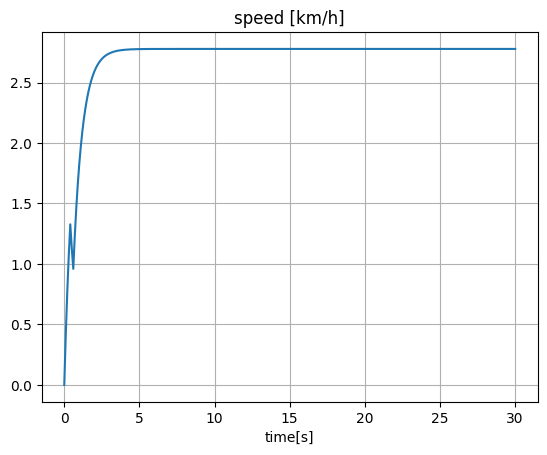

In [ ]:
import matplotlib.pyplot as plt
import math
import numpy as np
import pandas as pd
from utils.angle import angle_mod

from scipy import interpolate
from scipy import optimize

"""MODIFIED BY ZAKARIYA"""
Kp = 1.5  # speed proportional gain
# steering control parameter
KTH = 2.7
KE = 2.0
"""github.com/1naichii"""

dt = 0.1  # [s]
L = 2.9  # [m]

show_animation = True

class State:
    def __init__(self, x=0.0, y=0.0, yaw=0.0, v=0.0, direction=1):
        self.x = x
        self.y = y
        self.yaw = yaw
        self.v = v
        self.direction = direction

    def update(self, a, delta, dt):
        self.x   = self.x + self.v * math.cos(self.yaw) * dt
        self.y   = self.y + self.v * math.sin(self.yaw) * dt
        self.yaw = self.yaw + self.v / L * math.tan(delta) * dt
        self.v   = self.v + a * dt

class CubicSplinePath:
    def __init__(self, x, y):
        x, y = map(np.asarray, (x, y))
        s = np.append([0],(np.cumsum(np.diff(x)**2) + np.cumsum(np.diff(y)**2))**0.5)

        self.X = interpolate.CubicSpline(s, x)
        self.Y = interpolate.CubicSpline(s, y)

        self.dX = self.X.derivative(1)
        self.ddX = self.X.derivative(2)

        self.dY = self.Y.derivative(1)
        self.ddY = self.Y.derivative(2)

        self.length = s[-1]

    def calc_yaw(self, s):
        dx, dy = self.dX(s), self.dY(s)
        return np.arctan2(dy, dx)

    def calc_curvature(self, s):
        dx, dy   = self.dX(s), self.dY(s)
        ddx, ddy   = self.ddX(s), self.ddY(s)
        return (ddy * dx - ddx * dy) / ((dx ** 2 + dy ** 2)**(3 / 2))

    def __find_nearest_point(self, s0, x, y):
        def calc_distance(_s, *args):
            _x, _y= self.X(_s), self.Y(_s)
            return (_x - args[0])**2 + (_y - args[1])**2

        def calc_distance_jacobian(_s, *args):
            _x, _y = self.X(_s), self.Y(_s)
            _dx, _dy = self.dX(_s), self.dY(_s)
            return 2*_dx*(_x - args[0])+2*_dy*(_y-args[1])

        minimum = optimize.fmin_cg(calc_distance, s0, calc_distance_jacobian, args=(x, y), full_output=True, disp=False)
        return minimum

    def calc_track_error(self, x, y, s0):
        ret = self.__find_nearest_point(s0, x, y)

        s = ret[0][0]
        e = ret[1]

        k   = self.calc_curvature(s)
        yaw = self.calc_yaw(s)

        dxl = self.X(s) - x
        dyl = self.Y(s) - y
        angle = pi_2_pi(yaw - math.atan2(dyl, dxl))
        if angle < 0:
            e*= -1

        return e, k, yaw, s

def pid_control(target, current):
    a = Kp * (target - current)
    return a

def pi_2_pi(angle):
    return angle_mod(angle)

def rear_wheel_feedback_control(state, e, k, yaw_ref):
    v = state.v
    th_e = pi_2_pi(state.yaw - yaw_ref)

    omega = v * k * math.cos(th_e) / (1.0 - k * e) - \
        KTH * abs(v) * th_e - KE * v * math.sin(th_e) * e / th_e

    if th_e == 0.0 or omega == 0.0:
        return 0.0

    delta = math.atan2(L * omega / v, 1.0)

    return delta


def simulate(path_ref, goal):
    T = 500.0  # max simulation time
    goal_dis = 0.3

    state = State(x=-0.0, y=-0.0, yaw=0.0, v=0.0)

    time = 0.0
    x = [state.x]
    y = [state.y]
    yaw = [state.yaw]
    v = [state.v]
    t = [0.0]
    goal_flag = False

    s = np.arange(0, path_ref.length, 0.1)
    e, k, yaw_ref, s0 = path_ref.calc_track_error(state.x, state.y, 0.0)

    # Prepare list to store the simulation logs
    log_data = []

    while T >= time:
        e, k, yaw_ref, s0 = path_ref.calc_track_error(state.x, state.y, s0)
        di = rear_wheel_feedback_control(state, e, k, yaw_ref)

        speed_ref = calc_target_speed(state, yaw_ref)
        ai = pid_control(speed_ref, state.v)
        state.update(ai, di, dt)

        time = time + dt

        # Check goal
        dx = state.x - goal[0]
        dy = state.y - goal[1]
        if math.hypot(dx, dy) <= goal_dis:
            print("Goal")
            goal_flag = True
            break

        x.append(state.x)
        y.append(state.y)
        yaw.append(state.yaw)
        v.append(state.v)
        t.append(time)

        # Calculate track error for logging
        e, k, yaw_ref, s0 = path_ref.calc_track_error(state.x, state.y, s0)
        track_error = abs(e)  # Get the absolute track error

        # Calculate yaw and curvature for logging
        curvature = path_ref.calc_curvature(s0)  # Curvature at s0
        log_data.append([time, state.x, state.y, state.yaw, state.v * 3.6, track_error, state.yaw, curvature])  # Added yaw and curvature

        # Show animation
        if show_animation:
            plt.cla()
            plt.gcf().canvas.mpl_connect('key_release_event', lambda event: [exit(0) if event.key == 'escape' else None])
            plt.plot(path_ref.X(s), path_ref.Y(s), "-r", label="course")
            plt.plot(x, y, "ob", label="trajectory")
            plt.plot(path_ref.X(s0), path_ref.Y(s0), "xg", label="target")
            plt.axis("equal")
            plt.grid(True)
            plt.title(f"speed[km/h]:{round(state.v * 3.6, 2):.2f}, target s-param:{s0:.2f}")
            plt.pause(0.0001)

    # Save the log data to a CSV file
    df = pd.DataFrame(log_data, columns=['Time(s)', 'x(m)', 'y(m)', 'Yaw(rad)', 'Speed(km/h)', 'Track Error(m)', 'Yaw Angle(rad)', 'Curvature'])
    df.to_csv('hasil_log_fix.csv', index=False)

    return t, x, y, yaw, v, goal_flag

def calc_target_speed(state, yaw_ref):
    target_speed = 10.0 / 3.6

    dyaw = yaw_ref - state.yaw
    switch = math.pi / 4.0 <= dyaw < math.pi / 2.0

    if switch:
        state.direction *= -1
        return 0.0

    if state.direction != 1:
        return -target_speed

    return target_speed

def main():
    print("Rear wheel feedback tracking simulation started!!")
    ax = [0.0, 6.0, 12.5, 5.0, 7.5, 3.0, -1.0]
    ay = [0.0, 0.0, 5.0, 6.5, 3.0, 5.0, -2.0]
    goal = [ax[-1], ay[-1]]

    reference_path = CubicSplinePath(ax, ay)
    s = np.arange(0, reference_path.length, 0.1)

    t, x, y, yaw, v, goal_flag = simulate(reference_path, goal)

    # Test
    assert goal_flag, "Cannot goal"

    if show_animation:  # pragma: no cover
        plt.close()
        plt.subplots(1)
        plt.plot(ax, ay, "xb", label="input")
        plt.plot(reference_path.X(s), reference_path.Y(s), "-r", label="spline")
        plt.plot(x, y, "-g", label="tracking")
        plt.grid(True)
        plt.axis("equal")
        plt.xlabel("x[m]")
        plt.ylabel("y[m]")
        plt.legend()

        plt.subplots(1)
        plt.plot(t, v)
        plt.title("speed [km/h]")
        plt.xlabel("time[s]")
        plt.grid(True)

        plt.show()

if __name__ == '__main__':
    main()


,Time(s),x(m),y(m),Yaw(rad),Speed(km/h),Track Error(m),Yaw Angle(rad),Curvature,Curvature(1/m)
0,0.1,0.000000,0.000000,0.000000,1.500000,0.000000,0.000000,0.001570,1.750509e-03
1,0.2,0.041667,0.000000,0.340515,2.775000,0.000023,0.340515,0.001560,1.964114e-03
2,0.3,0.114324,0.025744,0.899598,3.858750,0.001491,0.899598,0.001545,2.218974e-03
3,0.4,0.180987,0.109680,1.515382,4.779937,0.016799,1.515382,0.001533,2.526653e-03
4,0.5,0.188340,0.242252,2.060292,4.062947,0.068727,2.060292,0.001534,2.903096e-03
5,0.6,0.135276,0.341859,2.368214,3.453505,0.126064,2.368214,0.001548,3.370761e-03
6,0.7,0.066632,0.408872,2.561499,4.435479,0.171232,2.561499,0.001565,3.962062e-03
7,0.8,-0.036420,0.476402,2.757327,5.270157,0.220106,2.757327,0.001590,4.725090e-03
8,0.9,-0.172137,0.531282,2.928012,5.979634,0.258314,2.928012,0.001624,5.733482e-03
9,1.0,-0.334464,0.566489,3.058681,6.582689,0.275423,3.058681,0.001665,7.104210e-03


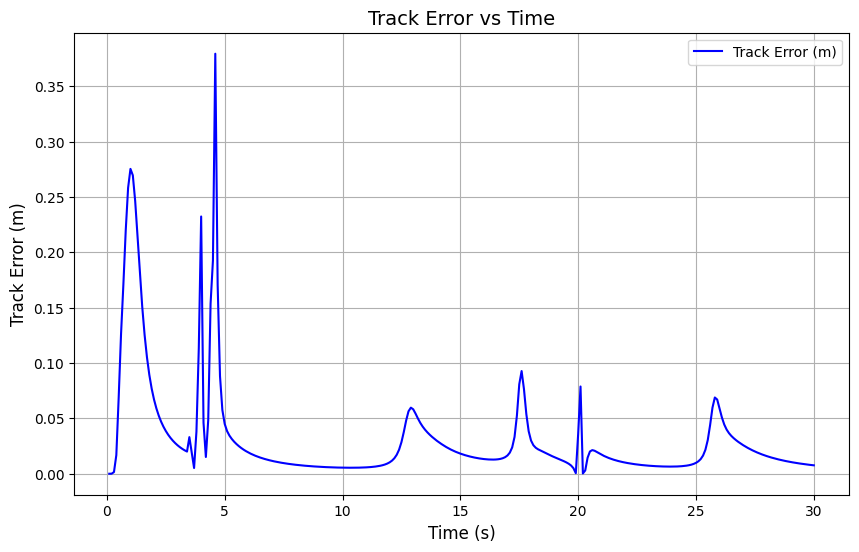

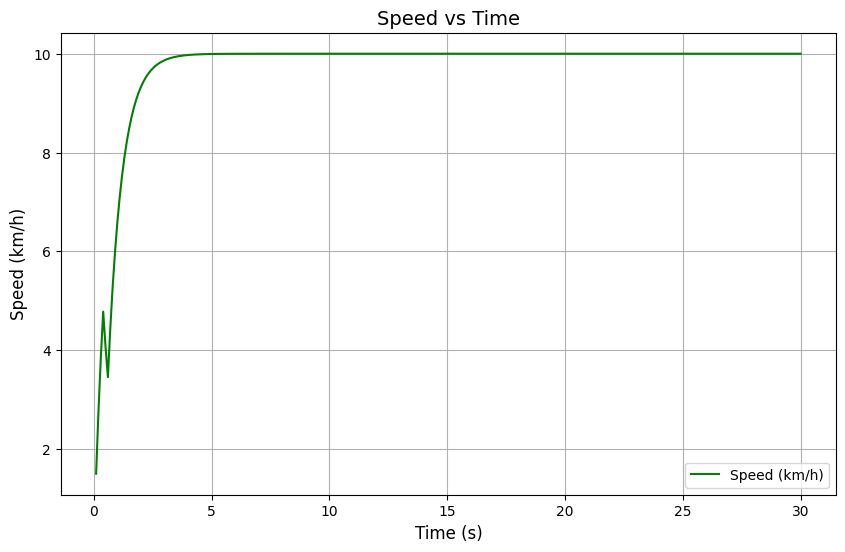

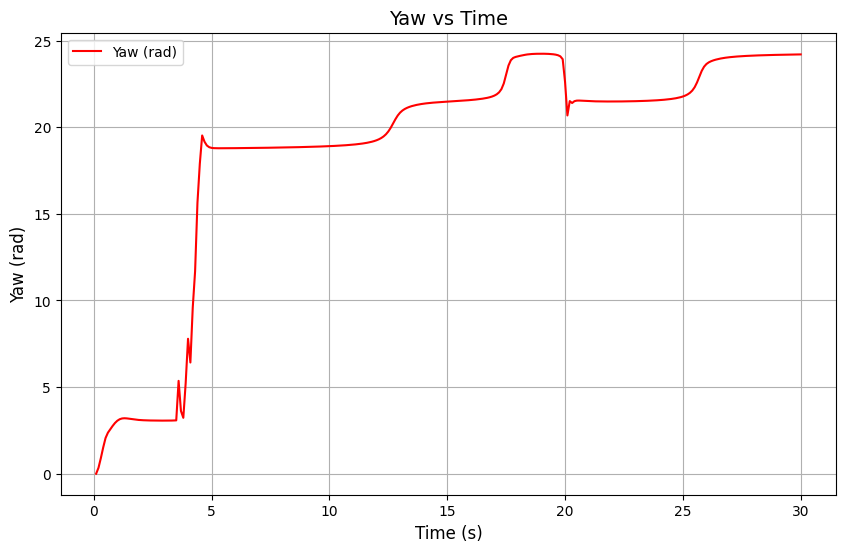

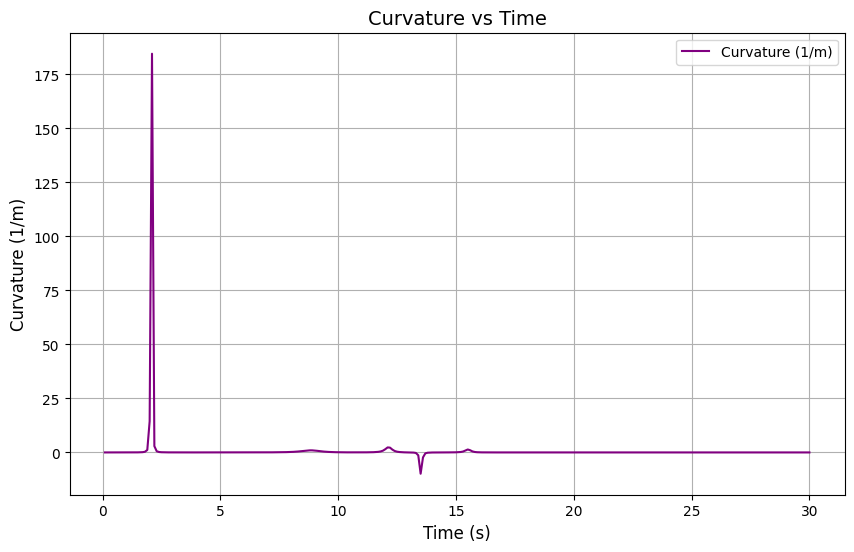

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import interpolate
from IPython.display import display, HTML
import math

# Assume you already have the necessary data from the CSV (df) loaded
df = pd.read_csv('hasil_log_fix.csv')

# Recreate the path reference from the input data (ax and ay) used for simulation
# You need to define ax, ay, or load it from the CSV if you have it.
ax = [0.0, 6.0, 12.5, 5.0, 7.5, 3.0, -1.0]  # Example path points (replace with your path)
ay = [0.0, 0.0, 5.0, 6.5, 3.0, 5.0, -2.0]

# Define CubicSplinePath class (already provided in your code)
class CubicSplinePath:
    def __init__(self, x, y):
        x, y = map(np.asarray, (x, y))
        s = np.append([0],(np.cumsum(np.diff(x)**2) + np.cumsum(np.diff(y)**2))**0.5)

        self.X = interpolate.CubicSpline(s, x)
        self.Y = interpolate.CubicSpline(s, y)

        self.dX = self.X.derivative(1)
        self.ddX = self.X.derivative(2)

        self.dY = self.Y.derivative(1)
        self.ddY = self.Y.derivative(2)

        self.length = s[-1]

    def calc_yaw(self, s):
        dx, dy = self.dX(s), self.dY(s)
        return np.arctan2(dy, dx)

    def calc_curvature(self, s):
        dx, dy   = self.dX(s), self.dY(s)
        ddx, ddy   = self.ddX(s), self.ddY(s)
        return (ddy * dx - ddx * dy) / ((dx ** 2 + dy ** 2)**(3 / 2))

# Recreate path_ref with the defined ax and ay
path_ref = CubicSplinePath(ax, ay)

# Calculate curvature at each time step
curvature = []
for index, row in df.iterrows():
    s0 = row['Time(s)']  # Assuming the s0 parameter is the same as time in the log
    k = path_ref.calc_curvature(s0)
    curvature.append(k)

# Add the curvature to the dataframe
df['Curvature(1/m)'] = curvature

# Display the dataframe in a scrollable format using HTML and CSS
display(HTML(df.to_html(classes='table table-striped table-bordered', escape=False)))

# Use CSS to make the dataframe scrollable
display(HTML('''
    <style>
        .dataframe {
            max-height: 400px;
            overflow-y: scroll;
            display: block;
        }
    </style>
'''))

# Plot Track Error over Time
plt.figure(figsize=(10, 6))
plt.plot(df['Time(s)'], df['Track Error(m)'], label='Track Error (m)', color='blue')
plt.title("Track Error vs Time", fontsize=14)
plt.xlabel("Time (s)", fontsize=12)
plt.ylabel("Track Error (m)", fontsize=12)
plt.grid(True)
plt.legend()
plt.show()

# Plot Speed over Time
plt.figure(figsize=(10, 6))
plt.plot(df['Time(s)'], df['Speed(km/h)'], label='Speed (km/h)', color='green')
plt.title("Speed vs Time", fontsize=14)
plt.xlabel("Time (s)", fontsize=12)
plt.ylabel("Speed (km/h)", fontsize=12)
plt.grid(True)
plt.legend()
plt.show()

# Plot Yaw over Time
plt.figure(figsize=(10, 6))
plt.plot(df['Time(s)'], df['Yaw(rad)'], label='Yaw (rad)', color='red')
plt.title("Yaw vs Time", fontsize=14)
plt.xlabel("Time (s)", fontsize=12)
plt.ylabel("Yaw (rad)", fontsize=12)
plt.grid(True)
plt.legend()
plt.show()

# Plot Curvature over Time
plt.figure(figsize=(10, 6))
plt.plot(df['Time(s)'], df['Curvature(1/m)'], label='Curvature (1/m)', color='purple')
plt.title("Curvature vs Time", fontsize=14)
plt.xlabel("Time (s)", fontsize=12)
plt.ylabel("Curvature (1/m)", fontsize=12)
plt.grid(True)
plt.legend()
plt.show()
